# Evaluation Project 5: Census Income Project

# Problem Statement

# Census Income Project is a classification based problem statement to predict if the salray range is below 50k or above as well as equal to 50k, it also strives to study and generate as many insights as possible. The data consists of: Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation, Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week, Native_country,Income details of each individual.

# Importing Data From Github repository dsrscientist/dataset1/master/census_income.csv

# Importing Required Libraries And Data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
data=pd.read_csv('census_income.csv',parse_dates=True)
data

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


# I have created a dataframe and stored it in variable data. This dataframe contains features and label to make predictions of salray of 32560 individuals.

In [2]:
data['Income'].unique()

array([' <=50K', ' >50K'], dtype=object)

# There are 2 unique values in label.

In [3]:
# Observation 1
shape_of_data=data.shape
print('Number Of Rows: ',shape_of_data[0], 'Number Of Columns: ', shape_of_data[1])

Number Of Rows:  32560 Number Of Columns:  15


In [4]:
data[data.values==' ?']

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
13,40,Private,121772,Assoc-voc,11,Married-civ-spouse,Craft-repair,Husband,Asian-Pac-Islander,Male,0,0,40,?,>50K
26,54,?,180211,Some-college,10,Married-civ-spouse,?,Husband,Asian-Pac-Islander,Male,0,0,60,South,>50K
26,54,?,180211,Some-college,10,Married-civ-spouse,?,Husband,Asian-Pac-Islander,Male,0,0,60,South,>50K
37,31,Private,84154,Some-college,10,Married-civ-spouse,Sales,Husband,White,Male,0,0,38,?,>50K
50,18,Private,226956,HS-grad,9,Never-married,Other-service,Own-child,White,Female,0,0,30,?,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32538,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,>50K
32540,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,<=50K
32540,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,<=50K
32541,72,?,129912,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,0,25,United-States,<=50K


In [5]:
data=data.apply(lambda x: x.replace(' ?', np.nan))
data

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [6]:
(data[data != ' ?']).any()

Age               True
Workclass         True
Fnlwgt            True
Education         True
Education_num     True
Marital_status    True
Occupation        True
Relationship      True
Race              True
Sex               True
Capital_gain      True
Capital_loss      True
Hours_per_week    True
Native_country    True
Income            True
dtype: bool

# Data Cleaning

In [7]:
data.columns

Index(['Age', 'Workclass', 'Fnlwgt', 'Education', 'Education_num',
       'Marital_status', 'Occupation', 'Relationship', 'Race', 'Sex',
       'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Native_country',
       'Income'],
      dtype='object')

# Checking column names to detect unnamed columns

In [8]:
print('Type of storage of data ', type(data), '\nType of data series ', type(data.columns))

Type of storage of data  <class 'pandas.core.frame.DataFrame'> 
Type of data series  <class 'pandas.core.indexes.base.Index'>


In [9]:
data.isna().any()

Age               False
Workclass          True
Fnlwgt            False
Education         False
Education_num     False
Marital_status    False
Occupation         True
Relationship      False
Race              False
Sex               False
Capital_gain      False
Capital_loss      False
Hours_per_week    False
Native_country     True
Income            False
dtype: bool

In [10]:
data.isna().values.any()

True

In [11]:
data.isnull().values.sum()

4262

In [12]:
data=data.fillna(method='bfill')

In [13]:
data.isna().any()

Age               False
Workclass         False
Fnlwgt            False
Education         False
Education_num     False
Marital_status    False
Occupation        False
Relationship      False
Race              False
Sex               False
Capital_gain      False
Capital_loss      False
Hours_per_week    False
Native_country    False
Income            False
dtype: bool

In [14]:
data.dtypes, len(data.dtypes)

(Age                int64
 Workclass         object
 Fnlwgt             int64
 Education         object
 Education_num      int64
 Marital_status    object
 Occupation        object
 Relationship      object
 Race              object
 Sex               object
 Capital_gain       int64
 Capital_loss       int64
 Hours_per_week     int64
 Native_country    object
 Income            object
 dtype: object,
 15)

# Tabulated Conclusion Of Data Cleaning

In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Age             32560 non-null  int64 
 1   Workclass       32560 non-null  object
 2   Fnlwgt          32560 non-null  int64 
 3   Education       32560 non-null  object
 4   Education_num   32560 non-null  int64 
 5   Marital_status  32560 non-null  object
 6   Occupation      32560 non-null  object
 7   Relationship    32560 non-null  object
 8   Race            32560 non-null  object
 9   Sex             32560 non-null  object
 10  Capital_gain    32560 non-null  int64 
 11  Capital_loss    32560 non-null  int64 
 12  Hours_per_week  32560 non-null  int64 
 13  Native_country  32560 non-null  object
 14  Income          32560 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


# Verbal Translation Of Conclusion Of Above Data Cleaning Process

# Conclusion:
1. There were 4262 missing values in the  dataset, I have filled those with previous values (method=backfill).
2. The whole dataset is of 32560 rows *15 columns, hence, chances of overfitting, that is, model getting trained more than essential are high so we will go through the data thoroughly and try to draw anomalies and code some derived features, that can be of help in making predictions.
3. There are 6 continuous columns and 9 categorical columns, hence, encoding is required.

# Dataset Visualization                                                                                                     

# Head View

In [16]:
data.head()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


# The above table represents first five rows of original dataset

# Sample View

In [17]:
data.sample()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
24913,58,Private,209438,Some-college,10,Divorced,Other-service,Unmarried,Black,Female,0,0,40,United-States,<=50K


# The above table represents a random row as sample row from the dataset

# Tail View

In [18]:
data.tail()

,Age,Workclass,Fnlwgt,Education,Education_num,Marital_status,Occupation,Relationship,Race,Sex,Capital_gain,Capital_loss,Hours_per_week,Native_country,Income
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K
32559,52,Self-emp-inc,287927,HS-grad,9,Married-civ-spouse,Exec-managerial,Wife,White,Female,15024,0,40,United-States,>50K


# The above table represents last five rows of the dataframe.

<Figure size 21600x21600 with 0 Axes>

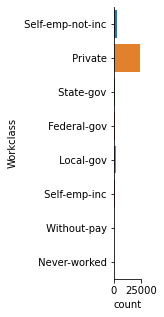

<Figure size 21600x21600 with 0 Axes>

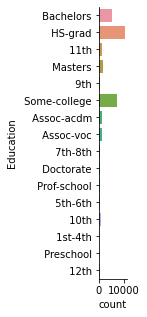

<Figure size 21600x21600 with 0 Axes>

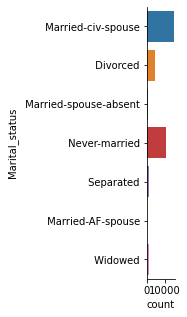

<Figure size 21600x21600 with 0 Axes>

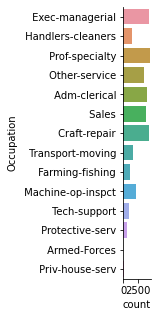

<Figure size 21600x21600 with 0 Axes>

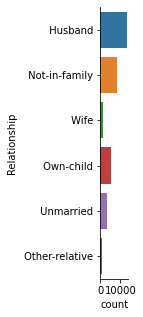

<Figure size 21600x21600 with 0 Axes>

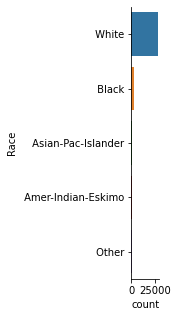

<Figure size 21600x21600 with 0 Axes>

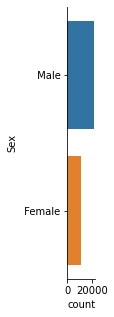

<Figure size 21600x21600 with 0 Axes>

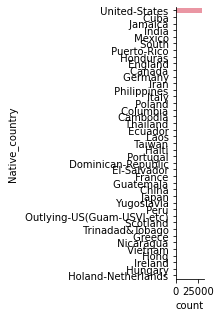

<Figure size 21600x21600 with 0 Axes>

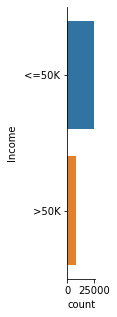

In [19]:
for x in data.select_dtypes(object).columns:
    plt.figure(figsize=(300,300))
    sns.catplot(y=x, kind='count', data=data,margin_titles=True, aspect=0.1)
    plt.show()

# Tabulated Analysis Of Above Count Plots

In [20]:
object_description=data.select_dtypes(object).describe()
object_description=object_description.rename(index={'count':'count of values', 'unique':'unique values', 'top':'most frequent value', 'freq':'frequency of most frequent value'})
dict1=object_description.iloc[0,:]-object_description.iloc[3,:]
object_description1=pd.concat([object_description, pd.DataFrame(dict1).T])
object_description1=object_description1.rename(index={0:'count of remaining values'})
object_description1

,Workclass,Education,Marital_status,Occupation,Relationship,Race,Sex,Native_country,Income
count of values,32560,32560,32560,32560,32560,32560,32560,32560,32560
unique values,8,16,7,14,6,5,2,41,2
most frequent value,Private,HS-grad,Married-civ-spouse,Prof-specialty,Husband,White,Male,United-States,<=50K
frequency of most frequent value,24056,10501,14976,4410,13193,27815,21789,29694,24719
count of remaining values,8504,22059,17584,28150,19367,4745,10771,2866,7841


# Verbal Translation Of Above Table

1. There are 9 object columns, of which 2 are spread across two values:
i. Income has 24719 values as <=50k and 7841 values as >50k (7841 individuals make income > 50k).

ii. Sex has 21789 values as Males and 10771 values as female.

Apart from these, remaining 7 columns have more than 2 unique values and are arranged in cell above:
Rows 3, 4 and 5 explain the most frequent value and its count and data portion occupied by other unique values.

For example, there are 24056 Private Workclass and 8504 all other workclass.

# Unique Values Of All Columns With DataType Object

In [21]:
data['Workclass'].unique(), data['Education'].unique(), data['Marital_status'].unique(), data['Occupation'].unique(), data['Relationship'].unique(), data['Race'].unique(), data['Sex'].unique(), data['Native_country'].unique(), data['Income'].unique()

(array([' Self-emp-not-inc', ' Private', ' State-gov', ' Federal-gov',
        ' Local-gov', ' Self-emp-inc', ' Without-pay', ' Never-worked'],
       dtype=object),
 array([' Bachelors', ' HS-grad', ' 11th', ' Masters', ' 9th',
        ' Some-college', ' Assoc-acdm', ' Assoc-voc', ' 7th-8th',
        ' Doctorate', ' Prof-school', ' 5th-6th', ' 10th', ' 1st-4th',
        ' Preschool', ' 12th'], dtype=object),
 array([' Married-civ-spouse', ' Divorced', ' Married-spouse-absent',
        ' Never-married', ' Separated', ' Married-AF-spouse', ' Widowed'],
       dtype=object),
 array([' Exec-managerial', ' Handlers-cleaners', ' Prof-specialty',
        ' Other-service', ' Adm-clerical', ' Sales', ' Craft-repair',
        ' Transport-moving', ' Farming-fishing', ' Machine-op-inspct',
        ' Tech-support', ' Protective-serv', ' Armed-Forces',
        ' Priv-house-serv'], dtype=object),
 array([' Husband', ' Not-in-family', ' Wife', ' Own-child', ' Unmarried',
        ' Other-relative'], d

# Feature Engineering

# Encoding

In [22]:
data.select_dtypes(object).columns

Index(['Workclass', 'Education', 'Marital_status', 'Occupation',
       'Relationship', 'Race', 'Sex', 'Native_country', 'Income'],
      dtype='object')

# Encoding Of All Other Object Columns With Ordinal Encoder (9 such columns)

In [23]:
from sklearn.preprocessing import OrdinalEncoder
encoder = OrdinalEncoder()
# transform data
result = encoder.fit_transform(data.select_dtypes(include = [object]))
encoded_data=pd.DataFrame(data=result, columns=data.select_dtypes(include = [object]).columns+'_'+'encoded')
encoded_data

,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,5.0,9.0,2.0,3.0,0.0,4.0,1.0,38.0,0.0
1,3.0,11.0,0.0,5.0,1.0,4.0,1.0,38.0,0.0
2,3.0,1.0,2.0,5.0,0.0,2.0,1.0,38.0,0.0
3,3.0,9.0,2.0,9.0,5.0,2.0,0.0,4.0,0.0
4,3.0,12.0,2.0,3.0,5.0,4.0,0.0,38.0,0.0
...,...,...,...,...,...,...,...,...,...
32555,3.0,7.0,2.0,12.0,5.0,4.0,0.0,38.0,0.0
32556,3.0,11.0,2.0,6.0,0.0,4.0,1.0,38.0,1.0
32557,3.0,11.0,6.0,0.0,4.0,4.0,0.0,38.0,0.0
32558,3.0,11.0,4.0,0.0,3.0,4.0,1.0,38.0,0.0


# Comparison Of Encoded Column And Original Column ('Income')

In [24]:
encoded_data['Income_encoded'].unique()

array([0., 1.])

In [25]:
data['Income'].unique()

array([' <=50K', ' >50K'], dtype=object)

# Conclusion
<=50k is encoded as 0, >50k is encoded as 1.

# Concatenating Encoded Data With Original Data

In [26]:
data=pd.concat([data, encoded_data], axis=1, ignore_index=False)
data=data.fillna(0)
data=data.drop(data.select_dtypes(object).columns, axis=1)
data.head()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,5.0,9.0,2.0,3.0,0.0,4.0,1.0,38.0,0.0
1,38,215646,9,0,0,40,3.0,11.0,0.0,5.0,1.0,4.0,1.0,38.0,0.0
2,53,234721,7,0,0,40,3.0,1.0,2.0,5.0,0.0,2.0,1.0,38.0,0.0
3,28,338409,13,0,0,40,3.0,9.0,2.0,9.0,5.0,2.0,0.0,4.0,0.0
4,37,284582,14,0,0,40,3.0,12.0,2.0,3.0,5.0,4.0,0.0,38.0,0.0


# Saving a copy of dataframe as final_dataframe that will be used further and data will be kept as storage of encoded and raw data.

In [27]:
final_dataframe=data.copy()

In [28]:
final_dataframe.isna().values.any()

False

In [29]:
final_dataframe=final_dataframe.fillna(0)
final_dataframe.isna().values.any()

False

In [30]:
final_dataframe[np.isinf(final_dataframe)] = 0

# There are no null and missing values in final dataframe.

# EDA Part 1

In [31]:
final_dataframe[:10]

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,5.0,9.0,2.0,3.0,0.0,4.0,1.0,38.0,0.0
1,38,215646,9,0,0,40,3.0,11.0,0.0,5.0,1.0,4.0,1.0,38.0,0.0
2,53,234721,7,0,0,40,3.0,1.0,2.0,5.0,0.0,2.0,1.0,38.0,0.0
3,28,338409,13,0,0,40,3.0,9.0,2.0,9.0,5.0,2.0,0.0,4.0,0.0
4,37,284582,14,0,0,40,3.0,12.0,2.0,3.0,5.0,4.0,0.0,38.0,0.0
5,49,160187,5,0,0,16,3.0,6.0,3.0,7.0,1.0,2.0,0.0,22.0,0.0
6,52,209642,9,0,0,45,5.0,11.0,2.0,3.0,0.0,4.0,1.0,38.0,1.0
7,31,45781,14,14084,0,50,3.0,12.0,4.0,9.0,1.0,4.0,0.0,38.0,1.0
8,42,159449,13,5178,0,40,3.0,9.0,2.0,3.0,0.0,4.0,1.0,38.0,1.0
9,37,280464,10,0,0,80,3.0,15.0,2.0,3.0,0.0,2.0,1.0,38.0,1.0


# The above table represents first 10 rows from final dataframe.

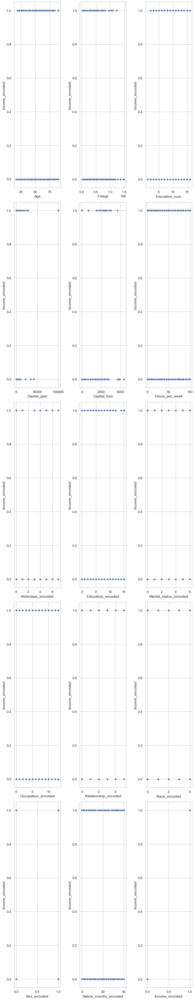

In [32]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.scatterplot(colist[x], y='Income_encoded', data=final_dataframe)
        plt.tight_layout()
    except ValueError:
        continue

# It can be visualized from above scatter plots against outcome vector that distribution is mostly evenly distributed for most of the columns. For example, 
i. Sex

ii. Native Country

iii. Race

iv. Relationship

v. Occupation

vi. Marital Status

vii. Education

viii. Workclass

ix. Hours Per Week

For example, 

<=50k is encoded as 0, >50k is encoded as 1.

# Anomalies Detected

i. people with more age have income <=50k, till age (~) 78 income ranges are equally distributed beyond that income points are more in >50k

ii. Gender has equal distribution and hence has no impact in prediction.

iii. Higher fnlwght bearers have income <= 50k, it is stable till (~) 0.8, beyond which it has more density at income ,= 50k than less than 50k.Beyond that, there are only 4 points in income > 50k, there are only two points in income 1 after fnlwght 1.

iv. Education num less than 5 has more density at income income <=50k, higher than that area, income is equally distributed for all education num.

v. In capital gain, an outlier is observed at Income 1 and a few scattered points at income 0.

vi. Apart from never worked, which has income point at 0, distribution of income of workclass is equally distributed.

vii. Capital loss has high density at income range 1 around 2000.

viii. Doctorate makes income > 50k, other education are equally distributed for both income range.

ix. Marital status is equally distributed and hence does nnot have much impact on prediction.

x. Native Country is equally distributed and hence does nnot have much impact on prediction. 

# Value Count Of employees vulnerable to attrition and not.

In [35]:
data['Income_encoded'].value_counts()

0.0    24719
1.0     7841
Name: Income_encoded, dtype: int64

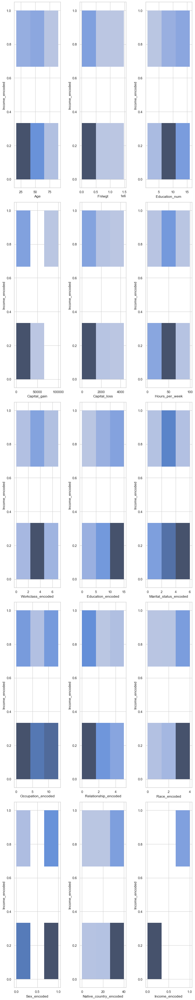

In [36]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.histplot(x=colist[x], y='Income_encoded', data=final_dataframe, bins=3)
        plt.tight_layout()
    except ValueError:
        continue

# The above histograms show frequency distribution of features agains label. It is divided into 3 bins. Native Country Encoded; Race Encoded, Education Encoded, Sex Encoded  show left skewness beyond -0.65 (less than lower acceptable skewness). Many datapoints, Relationship_encoded, Fnlwgt , Capital_loss, Capital_gain seem to have right skewness beyond +0.65 (more than upper acceptable skewness). skewness threshold of +/-0.65 is maintained by:

Education_num, 

Marital_status_encoded,

Workclass_encoded,

Occupation_encoded,

Hours_per_week, and

Age

# Correlation Analysis

In [33]:
final_dataframe.corr()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
Age,1.000000,-0.076646,0.036527,0.077674,0.057775,0.068756,0.043619,-0.010508,-0.266292,-0.006661,-0.263698,0.028718,0.088832,0.000773,0.234039
Fnlwgt,-0.076646,1.000000,-0.043159,0.000437,-0.010259,-0.018770,-0.022029,-0.028156,0.028184,-0.000627,0.008922,-0.021278,0.026882,-0.062633,-0.009481
Education_num,0.036527,-0.043159,1.000000,0.122627,0.079932,0.148127,0.002246,0.359172,-0.069338,0.082215,-0.094145,0.031825,0.012256,0.086841,0.335182
Capital_gain,0.077674,0.000437,0.122627,1.000000,-0.031614,0.078409,0.029986,0.030047,-0.043398,0.021018,-0.057918,0.011143,0.048477,0.009287,0.223333
Capital_loss,0.057775,-0.010259,0.079932,-0.031614,1.000000,0.054256,0.003220,0.016744,-0.034182,0.010757,-0.061064,0.018902,0.045572,0.008567,0.150523
Hours_per_week,0.068756,-0.018770,0.148127,0.078409,0.054256,1.000000,0.036407,0.055510,-0.190521,0.018141,-0.248975,0.041910,0.229312,0.005602,0.229690
Workclass_encoded,0.043619,-0.022029,0.002246,0.029986,0.003220,0.036407,1.000000,0.003356,-0.020339,0.011388,-0.054991,0.046754,0.070016,-0.001429,0.002335
Education_encoded,-0.010508,-0.028156,0.359172,0.030047,0.016744,0.055510,0.003356,1.000000,-0.038398,-0.036928,-0.010879,0.014135,-0.027349,0.075638,0.079311
Marital_status_encoded,-0.266292,0.028184,-0.069338,-0.043398,-0.034182,-0.190521,-0.020339,-0.038398,1.000000,0.021813,0.185461,-0.068025,-0.129337,-0.022210,-0.199295
Occupation_encoded,-0.006661,-0.000627,0.082215,0.021018,0.010757,0.018141,0.011388,-0.036928,0.021813,1.000000,-0.048144,-0.001308,0.057430,-0.002296,0.048755


# The above table represents correlation among dataset. There seems some multicollinearity due to presence of Education Encoded and Hours Per Week; that show strong correlation between each other. Other  than these columns there seems modest collinearity among features. We will do further eda befor arriving at a conclusion to delete these columns.

# Graphical Representation Of Correlation Of Features With Label

In [34]:
import cufflinks as cf
cf.set_config_file(offline=True)
pd.DataFrame((final_dataframe.corr()['Income_encoded'])).iplot(title='Correlation Of Variables With Label')

# The above iplot represents correlation of features with label. Correlation of features with labe is of high relevance. The stronger the relationship of label with axis, the more accurate the prediction. In the above line graph:

1. Highest correlation with label is observed to be 33.52%, that is shared with Education Num. Minimum correlation is 0.23%, shared with Workclass Encoded.

2. Weak Positive Relationship Is Found With Following Features:

Workclass_encoded         0.002335

Native_country_encoded    0.023376

Occupation_encoded        0.048755

Race_encoded              0.071853

Education_encoded         0.079311

Capital_loss              0.150523

Sex_encoded               0.215995

Capital_gain              0.223333

Hours_per_week            0.229690

Age                       0.234039

Education_num             0.335182


3. Weak Negative Relationship Is Found With Following Features:

Relationship_encoded     -0.250924

Marital_status_encoded   -0.199295

Fnlwgt                   -0.009481

4. Correlation Of Label with itself is of no relevance

# Mathematical Notation:
Correlation (X, Y) = (Covariance Of X and Covariance Of Y)/(Std Of X and Std Of Y)

# Correlation Heatmaps Of Individual Datasets

# Correlation Heatmap Of Original Dataset for 26 columns

<AxesSubplot:>

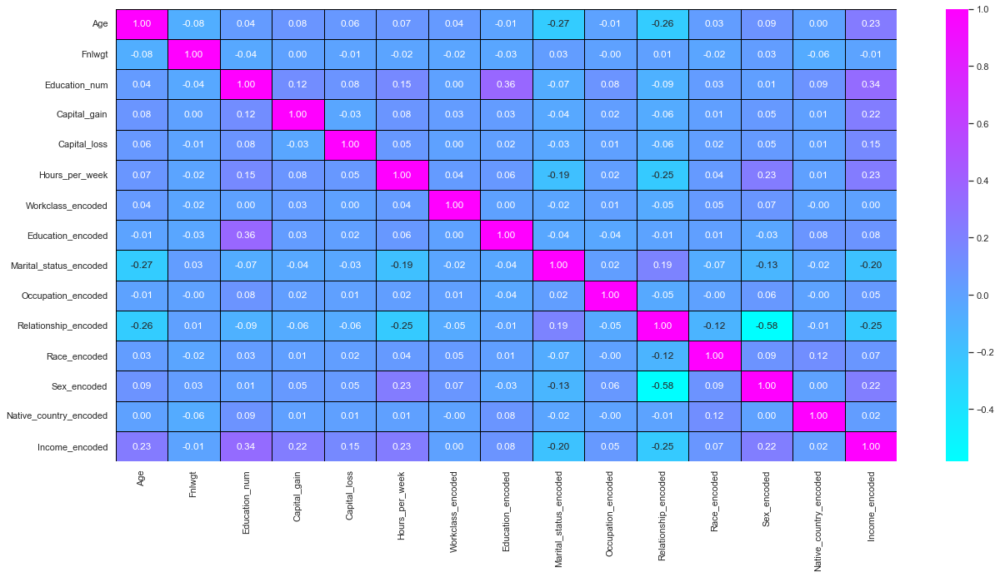

In [35]:
plt.figure(figsize=(21,10))
sns.heatmap(final_dataframe.corr().iloc[:,:27], annot=True, linewidths=0.5, linecolor='black', fmt='.2f', cmap='cool')

# Verbal Translation Of Above Graph:

# 1. Label has Weak Positive Relationship With Following Features:

    Workclass_encoded

    Native_country_encoded

    Occupation_encoded

    Race_encoded

    Education_encoded

    Capital_loss

    Sex_encoded

    Capital_gain

    Hours_per_week

    Age

    Education_num

# 2. Label has Weak Negative To Strong Negative Relationship With Following Features:
    Relationship_encoded

    Marital_status_encoded

    Fnlwgt

# 3. Strong Multicollinearity is detected between 2 features:

    Education Encoded

    Hours Per Week

# 4. Multicollinearity seems to be moderate among all other data points.

# Q&A Answered:

    1. Most useful feature is: Education Num
    
    2. Features that can cause bias are: Education Encoded and Hours Per Week
    
    3. Explanatory Power of all variable: Weak (due to weak correlation with label).

# Data Handling Conclusion Of Correlation

# Overall correlation among dataset. There seems some multicollinearity due to presence of Education Encoded and Hours Per Week; that show strong correlation between each other. Other than these columns there seems modest collinearity among features. We will do further eda before arriving at a conclusion to delete these columns.

The most useful feature is Education Num, apart from this, there seems modest correlation of features with label.

As a conclusion, we will do further cause and effect analysis based on skewness and distribution plots to conclude if we want to remove multicollinarity pairs:

i. Education Encoded

ii. Hours Per Week

# Dataset Information Table

In [36]:
final_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32560 entries, 0 to 32559
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     32560 non-null  int64  
 1   Fnlwgt                  32560 non-null  int64  
 2   Education_num           32560 non-null  int64  
 3   Capital_gain            32560 non-null  int64  
 4   Capital_loss            32560 non-null  int64  
 5   Hours_per_week          32560 non-null  int64  
 6   Workclass_encoded       32560 non-null  float64
 7   Education_encoded       32560 non-null  float64
 8   Marital_status_encoded  32560 non-null  float64
 9   Occupation_encoded      32560 non-null  float64
 10  Relationship_encoded    32560 non-null  float64
 11  Race_encoded            32560 non-null  float64
 12  Sex_encoded             32560 non-null  float64
 13  Native_country_encoded  32560 non-null  float64
 14  Income_encoded          32560 non-null

# The above table reprents information dataset:
    
i. Columns

ii. Count Of Non Null Data Points

iii. Values data type for each columns

iv. Count of data types in iii.

v. Memory Usage

It can be deduced that the dataset has 32560 rows and each columns has no missing values. The datatype used are float64 and int64. There 9 float64 columns and 6 int64 columns. Memory usage is 3.7 MB.

# Names of all the columns

In [37]:
data.select_dtypes(include = [np.number]).columns

Index(['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss',
       'Hours_per_week', 'Workclass_encoded', 'Education_encoded',
       'Marital_status_encoded', 'Occupation_encoded', 'Relationship_encoded',
       'Race_encoded', 'Sex_encoded', 'Native_country_encoded',
       'Income_encoded'],
      dtype='object')

# The above code cell highlights all numeric columns, that will be used to derive following graphs.

# Box Plot To Detect Outliers

In [47]:
import plotly.express as px
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
for x in colist:
    try:
        plot = px.box(x=final_dataframe[x], y=final_dataframe['Income_encoded'], title='{0} Against Income_Encoded'.format(x))
        plot.show()
    except ValueError:
        print('{0} vales out of range, try skewness function to detect outliers'.format(x))
        continue

# Verbal Translation Of Above Graph
# 1. The data is free of outliers.
# 2. The data values have not even reached upper quartile for most of the plots, example, Capital Loss
# 3. For plots like, Native Country Encoded, it has extended only to maximum for some of the distinct values.

# Data Handling Conclusion For Outliers

# Box plot does not extend to even upper quartile for most of the cases, Hence we will study skewness and kurtosis to arrive at final conclusion about multicollinearity and outliers detected.

# Descriptive Statistics

In [49]:
description=final_dataframe.describe()
description

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469,3.101259,10.298249,2.611794,5.969165,1.446376,3.665848,0.669195,36.382862,0.240817
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618,1.138969,3.870317,1.506225,4.024675,1.606794,0.848817,0.470510,6.117845,0.427586
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000,3.000000,9.000000,2.000000,2.000000,0.000000,4.000000,0.000000,38.000000,0.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000,3.000000,11.000000,2.000000,6.000000,1.000000,4.000000,1.000000,38.000000,0.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000,3.000000,12.000000,4.000000,9.000000,3.000000,4.000000,1.000000,38.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,7.000000,15.000000,6.000000,13.000000,5.000000,4.000000,1.000000,40.000000,1.000000


In [50]:
lst=description.columns.to_list()
print(lst)

['Age', 'Fnlwgt', 'Education_num', 'Capital_gain', 'Capital_loss', 'Hours_per_week', 'Workclass_encoded', 'Education_encoded', 'Marital_status_encoded', 'Occupation_encoded', 'Relationship_encoded', 'Race_encoded', 'Sex_encoded', 'Native_country_encoded', 'Income_encoded']


In [51]:
lst1=[]
for x in range(len(lst)):
    lst1.append([description.iloc[6,x]-description.iloc[5,x]])
len(lst1), print(lst1)

[[11.0], [58691.5], [2.0], [0.0], [0.0], [5.0], [0.0], [1.0], [2.0], [3.0], [2.0], [0.0], [0.0], [0.0], [0.0]]


(15, None)

In [52]:
lst1_frame=pd.DataFrame(data=lst1, index=lst, columns=['IQR'])
lst1_frame=lst1_frame.T
lst1_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
IQR,11.0,58691.5,2.0,0.0,0.0,5.0,0.0,1.0,2.0,3.0,2.0,0.0,0.0,0.0,0.0


In [53]:
lst3=[]
for x in range(len(lst)):
    lst3.append([description.iloc[7,x]-description.iloc[3,x]])
len(lst3), print(lst3)

[[73.0], [1472420.0], [15.0], [99999.0], [4356.0], [98.0], [7.0], [15.0], [6.0], [13.0], [5.0], [4.0], [1.0], [40.0], [1.0]]


(15, None)

In [54]:
lst3_frame=pd.DataFrame(data=lst3, index=lst, columns=['Range'])
lst3_frame=lst3_frame.T
lst3_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
Range,73.0,1472420.0,15.0,99999.0,4356.0,98.0,7.0,15.0,6.0,13.0,5.0,4.0,1.0,40.0,1.0


In [55]:
lst5=pd.DataFrame(data=final_dataframe.skew().to_list(), index=lst, columns=['Skewness'])
lst5=lst5.T
lst6=pd.DataFrame(data=final_dataframe.kurtosis().to_list(), index=lst, columns=['Kurtosis'])
lst6=lst6.T
lst5, lst6

(               Age    Fnlwgt  Education_num  Capital_gain  Capital_loss  \
 Skewness  0.558738  1.446972       -0.31163      11.95369      4.594549   
 
           Hours_per_week  Workclass_encoded  Education_encoded  \
 Skewness        0.227636           0.061669          -0.934063   
 
           Marital_status_encoded  Occupation_encoded  Relationship_encoded  \
 Skewness               -0.013448            0.104958              0.786784   
 
           Race_encoded  Sex_encoded  Native_country_encoded  Income_encoded  
 Skewness     -2.435332    -0.719244               -4.188026        1.212383  ,
                Age   Fnlwgt  Education_num  Capital_gain  Capital_loss  \
 Kurtosis -0.166212  6.21894       0.623525    154.795024     20.376029   
 
           Hours_per_week  Workclass_encoded  Education_encoded  \
 Kurtosis        2.916505           1.989601           0.680606   
 
           Marital_status_encoded  Occupation_encoded  Relationship_encoded  \
 Kurtosis               

# Outcome Table Of Descriptive Statistics

In [56]:
description1=pd.concat([description, lst1_frame, lst3_frame, lst5, lst6])
description1

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469,3.101259,10.298249,2.611794,5.969165,1.446376,3.665848,0.669195,36.382862,0.240817
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618,1.138969,3.870317,1.506225,4.024675,1.606794,0.848817,0.470510,6.117845,0.427586
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000,3.000000,9.000000,2.000000,2.000000,0.000000,4.000000,0.000000,38.000000,0.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000,3.000000,11.000000,2.000000,6.000000,1.000000,4.000000,1.000000,38.000000,0.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000,3.000000,12.000000,4.000000,9.000000,3.000000,4.000000,1.000000,38.000000,0.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000,7.000000,15.000000,6.000000,13.000000,5.000000,4.000000,1.000000,40.000000,1.000000
IQR,11.000000,5.869150e+04,2.000000,0.000000,0.000000,5.000000,0.000000,1.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000
Range,73.000000,1.472420e+06,15.000000,99999.000000,4356.000000,98.000000,7.000000,15.000000,6.000000,13.000000,5.000000,4.000000,1.000000,40.000000,1.000000


# Graphical Representation Of Above Table

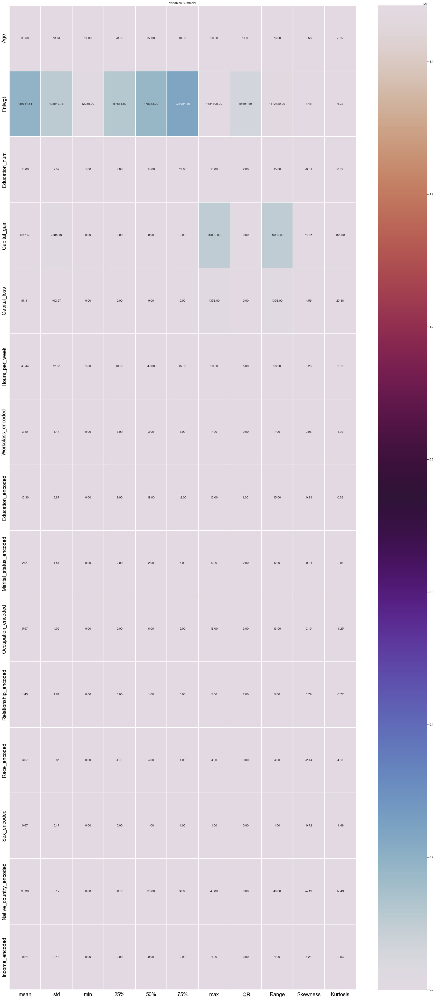

In [57]:
import numpy as np
import warnings
warnings.filterwarnings('ignore')
plt.figure(figsize=(30,70))
sns.heatmap(round(description1[1:].transpose(),2), linewidth=2, annot=True, fmt='.2f', square=False, color='Black', cmap='twilight')
plt.xticks(fontsize=20, color='black')
plt.yticks(fontsize=20, color='black')
plt.title('Variables Summary')
plt.show()

# Mathematical Notation:
1. Mean = sum of values/count of values                                                                                     
2. std = sqrt(((value - mean of distribution)**2 / number of values ))                                                                                        
3. 3 quartile are measures of variance, calculated to spot the placeholder value, it returns index of the produced value.
Step 1: sort the dataset                                                                                                   
Step2:                                                                                                                     
i) Lower Quartile (Q1: 25% distribution) = ((number of values+1)/4)th Term                                                 
ii) Middle Quartile (Q2: 50% distribution) = ((number of values +1)/2)th Term                                               
Also, know as median (central value).                                                                                       
iii) Upper Quartile (Q3: 75% distribution) = ¾(number of values + 1)th Term                                                 
iv) IQR = Upper Quartile - Lowe Quartile                                                                                   
4. Range = Maximum Value - Minimum Value                                                                                   
5. Skewness = (sumation(value - mean of distribution)**3)/((number of values - 1) * std**3)                                 
6. Kurtosis = number of values * ((sumation(value - mean of distribution)**4) / std**4)

# Verbal Translation Of Descriptive Table And Graphic
# 1. For values that are scaled upto 1, mean is mostly around 0 and standard deviation is comparatively low. Hence, making the data much more acceptable by algorithms to process it more accurately.

# 2. The entire dataset ranges from 0 till 1484705.0.

# 3. IQR, Range and Skewness and kurtosis are much more condensed in data that is scaled upto 1.

# 4. Skewness is 0 and within +/- 0.65 for:
    
    Education_num

    Marital_status_encoded
    
    Workclass_encoded
    
    Occupation_encoded
    
    Hours_per_week
    
    Age

# 5. Acceptable skewness is +/- 0.65 and skewness for bell shaped curve should be 0.

# 6. Kutosis is upto 3 for most dataset, indicating platykurtic curves:

    Sex_encoded

    Occupation_encoded

    Relationship_encoded

    Marital_status_encoded

    Income_encoded

    Age

    Education_num

    Education_encoded

    Workclass_encoded

    Hours_per_week

# 7. Kurtosis is greater than 3, indicating, leptokurtic curve, for:

    Race_encoded

    Fnlwgt

    Native_country_encoded

    Capital_loss

    Capital_gain

# 8. Kurtosis for bell shaped curve should be 3.

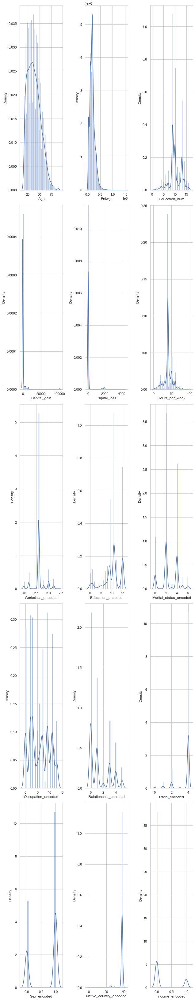

In [48]:
colist=final_dataframe.select_dtypes(include = [np.number]).columns
ncol=3
nrows=10
plt.figure(figsize=(ncol*3, ncol*30))
for x in range(0,len(colist)):
    try:
        sns.set_theme(style='whitegrid')
        plt.subplot(nrows, ncol, x+1)
        sns.distplot(final_dataframe[colist[x]])
        plt.tight_layout()
    except ValueError:
        continue

# Observations
# 1. Acceptable skewness is +/-0.65 and correct skewness for bell shaped curve is 0

# 2. Acceptable and Outliers Prone Left skewness is observed in:

    Native_country_encoded    -4.188026

    Race_encoded              -2.435332

    Education_encoded         -0.934063

    Sex_encoded               -0.719244

    Education_num             -0.311630

    Marital_status_encoded    -0.013448

# 3. Acceptable And Outliers Prone Right Skewness is observed in:

    Workclass_encoded          0.061669

    Occupation_encoded         0.104958

    Hours_per_week             0.227636

    Age                        0.558738

    Relationship_encoded       0.786784

    Income_encoded             1.212383

    Fnlwgt                     1.446972

    Capital_loss               4.594549

    Capital_gain              11.953690

# 4. Bell Shaped Curve has 0 skewness.

# Conclusion:
Based On EDA done above in two parts, I will do ftest and pvalue test on these seeming strong and weak indicators:

1. Education Num

2. Education Encoded

3. Hours Per Week

4. Capital Gain

5. Capital Loss


# ANOVA Test On Selected Features
# Ftest score should be greater than 1 and p value should be less than 0.05, to determine to keep these features for further analysis

# Feature 1: Education Num

In [72]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Education_num'], final_dataframe['Income_encoded'])
f,p

(463489.11154050974, 0.0)

# Feature 2: Education Encoded

In [73]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Education_encoded'], final_dataframe['Income_encoded'])
f,p

(217218.57670733653, 0.0)

# Feature 3: Hours Per Week

In [74]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Hours_per_week'], final_dataframe['Income_encoded'])
f,p

(344649.22978433646, 0.0)

# Feature 4: Capital Gain

In [75]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Capital_gain'], final_dataframe['Income_encoded'])
f,p

(692.897932438427, 6.565541578530214e-152)

# Feature 5: Capital Loss

In [76]:
from scipy.stats import f_oneway
f,p=f_oneway(final_dataframe['Capital_loss'], final_dataframe['Income_encoded'])
f,p

(1519.9908764251725, 0.0)

# Error Removal And Data Handling

# Based on above analysis:

# 1. There is no skewness in the data.

# 2. Strong multicolliearity features are important for prediction because there f test and p value are acceptable. This mean that the amount of multicollineaity is not that significant to remove the features.

# 3. Extereme platykurtic features are also relatively significant based on f test and p test.

# Hence, as a solution, feature scaling will do a better job in explaining the dependent variable than removing whole columns.

# The above table represents final dataframe that will go through machine learning  techniques of outliers treatment

# Z Score: Outliers Treatment

In [78]:
import numpy as np
from scipy.stats import stats
from sklearn.preprocessing import StandardScaler
final_dataframe[np.isinf(final_dataframe)] = 0
scaled = StandardScaler()
final_dataframe=final_dataframe.fillna(method='ffill')
scaled.fit(final_dataframe)
scaled_data = scaled.transform(final_dataframe)
score=np.abs(stats.zscore(scaled_data))
score.shape

(32560, 15)

In [79]:
#threshold=(-3,3)
threshold=3
print(np.where(score>3))

(array([    3,     9,    10, ..., 32532, 32550, 32552], dtype=int64), array([13,  5, 11, ..., 11, 11, 11], dtype=int64))


# The cell above displays outlier values.

In [80]:
len(np.where(score>3)[0])

5322

# The cell above shows number of outliers.

In [81]:
data_new=final_dataframe[(score<3).all(axis=1)]
data_new

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50,83311,13,0,0,13,5.0,9.0,2.0,3.0,0.0,4.0,1.0,38.0,0.0
1,38,215646,9,0,0,40,3.0,11.0,0.0,5.0,1.0,4.0,1.0,38.0,0.0
2,53,234721,7,0,0,40,3.0,1.0,2.0,5.0,0.0,2.0,1.0,38.0,0.0
4,37,284582,14,0,0,40,3.0,12.0,2.0,3.0,5.0,4.0,0.0,38.0,0.0
5,49,160187,5,0,0,16,3.0,6.0,3.0,7.0,1.0,2.0,0.0,22.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,257302,12,0,0,38,3.0,7.0,2.0,12.0,5.0,4.0,0.0,38.0,0.0
32556,40,154374,9,0,0,40,3.0,11.0,2.0,6.0,0.0,4.0,1.0,38.0,1.0
32557,58,151910,9,0,0,40,3.0,11.0,6.0,0.0,4.0,4.0,0.0,38.0,0.0
32558,22,201490,9,0,0,20,3.0,11.0,4.0,0.0,3.0,4.0,1.0,38.0,0.0


# The table above shows the final dataframe after removing outliers, 5322 rows are removed and resultant dimension is 27743 rows * 15 columns

# IQR Method Of Outliers Removal

# Since, all the rows are removed by z method, hence, I will try IQR Method of outliers removal and power transformation method of outliers transformation.

In [82]:
Q1= final_dataframe[final_dataframe.columns].quantile(0.25)
Q3 = final_dataframe[final_dataframe.columns].quantile(0.75)
IQR = Q3 - Q1
upper_limit = Q3 + 1.5 * IQR
lower_limit = Q1 - 1.5 * IQR

# The above code calculates IQR as discussed in descriptive statistics section of eda. It Upper Limit and Lower Limit of distribution curve.

In [83]:
final_dataframe[(final_dataframe[final_dataframe.columns] < lower_limit) | (final_dataframe[final_dataframe.columns] > upper_limit)] # outliers

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,NaN,NaN,NaN,NaN,NaN,13.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,2.0,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,4.0,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32556,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
32557,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32558,NaN,NaN,NaN,NaN,NaN,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# The above table displays, outliers detected by IQR Method, it displays all values beyond upper and lower limit and places NaN on all the values that are significant and within upper and lower limits.

In [84]:
new_df = final_dataframe[(final_dataframe[final_dataframe.columns] > lower_limit) & (final_dataframe[final_dataframe.columns] < upper_limit)]

In [85]:
new_df=new_df.fillna(method='bfill')
new_df

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded,Income_encoded
0,50.0,83311.0,13.0,NaN,NaN,40.0,NaN,9.0,2.0,3.0,0.0,NaN,1.0,NaN,NaN
1,38.0,215646.0,9.0,NaN,NaN,40.0,NaN,11.0,0.0,5.0,1.0,NaN,1.0,NaN,NaN
2,53.0,234721.0,7.0,NaN,NaN,40.0,NaN,9.0,2.0,5.0,0.0,NaN,1.0,NaN,NaN
3,28.0,338409.0,13.0,NaN,NaN,40.0,NaN,9.0,2.0,9.0,5.0,NaN,0.0,NaN,NaN
4,37.0,284582.0,14.0,NaN,NaN,40.0,NaN,12.0,2.0,3.0,5.0,NaN,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27.0,257302.0,12.0,NaN,NaN,38.0,NaN,7.0,2.0,12.0,5.0,NaN,0.0,NaN,NaN
32556,40.0,154374.0,9.0,NaN,NaN,40.0,NaN,11.0,2.0,6.0,0.0,NaN,1.0,NaN,NaN
32557,58.0,151910.0,9.0,NaN,NaN,40.0,NaN,11.0,6.0,0.0,4.0,NaN,0.0,NaN,NaN
32558,22.0,201490.0,9.0,NaN,NaN,40.0,NaN,11.0,4.0,0.0,3.0,NaN,1.0,NaN,NaN


# The above table displays the final dataframe after IQR  treatment, since this method restores all the rows. It signifies that outliers are not very much spread and can be treated with power transform method.

# I prefer Z Score+ Power Transform in this case because IQR has a lot of missing values and improper data, whole columns that have significant f value and p value are missing. Hence, I would remove some data points from theses columns using z score and then transform the entire dataset to make free from outliers and retain feature explanatory power.

# Vectorization

# I have divided the datset into X and Y vectors by removing label and its transformation from features vector.

Label vector is Income_Encoded.

In [88]:
final_dataframe=data_new.copy()
final_dataframe=final_dataframe.fillna(0)

In [89]:
x=final_dataframe.drop(['Income_encoded'], axis=1)
y=final_dataframe['Income_encoded']
x.sample()

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded
10030,19,208513,9,0,0,40,3.0,11.0,4.0,2.0,2.0,4.0,1.0,38.0


# The above table displays a sample of features vector.

In [90]:
y.sample()

26509    0.0
Name: Income_encoded, dtype: float64

# The above series displays a sample of label series.

# Outliers Transformation With Power Transform

In [91]:
from sklearn.preprocessing import power_transform
x_array=power_transform(x, method='yeo-johnson')
x_frame=pd.DataFrame(x_array, columns=x.columns)
x_frame

,Age,Fnlwgt,Education_num,Capital_gain,Capital_loss,Hours_per_week,Workclass_encoded,Education_encoded,Marital_status_encoded,Occupation_encoded,Relationship_encoded,Race_encoded,Sex_encoded,Native_country_encoded
0,0.925090,-1.126309,1.229997,-0.297013,-0.040307,-2.215636,1.705568,-0.489964,-0.384795,-0.624120,-1.107493,0.347941,0.713156,0.16122
1,0.128489,0.413111,-0.462964,-0.297013,-0.040307,-0.039834,-0.090815,0.077503,-1.760716,-0.096481,0.106849,0.347941,0.713156,0.16122
2,1.099938,0.593416,-1.260919,-0.297013,-0.040307,-0.039834,-0.090815,-2.073615,-0.384795,-0.096481,-1.107493,-2.877312,0.713156,0.16122
3,0.053414,1.035780,1.670443,-0.297013,-0.040307,-0.039834,-0.090815,0.382423,-0.384795,-0.624120,1.549878,0.347941,-1.402218,0.16122
4,0.864939,-0.156894,-2.018314,-0.297013,-0.040307,-2.011835,-0.090815,-1.225799,0.269623,0.366391,0.106849,-2.877312,-1.402218,-4.41410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27738,-0.802930,0.798525,0.796011,-0.297013,-0.040307,-0.222756,-0.090815,-0.996906,-0.384795,1.360025,1.549878,0.347941,-1.402218,0.16122
27739,0.274040,-0.221477,-0.462964,-0.297013,-0.040307,-0.039834,-0.090815,0.077503,-0.384795,0.141326,-1.107493,0.347941,0.713156,0.16122
27740,1.374466,-0.249182,-0.462964,-0.297013,-0.040307,-0.039834,-0.090815,0.077503,2.162490,-1.692039,1.344596,0.347941,-1.402218,0.16122
27741,-1.329706,0.274609,-0.462964,-0.297013,-0.040307,-1.722218,-0.090815,0.077503,0.910516,-1.692039,1.076218,0.347941,0.713156,0.16122


# The above table displays outliers transformed values as discussed above.

In [92]:
x_frame[np.isinf(x_frame)] = 0
x_frame[np.isnan(x_frame)]=0

# In the above cell, I have filled infinite and na values with 0, in case those arose during the process of transformation.

In [93]:
from sklearn.preprocessing import MinMaxScaler
scaled = MinMaxScaler([0,1])
scaled.fit(x_frame)
scaled_data = scaled.transform(x_frame)
scaled_data

array([[0.66891528, 0.24788705, 0.74699201, ..., 1.        , 1.        ,
        0.18128435],
       [0.48422856, 0.55256556, 0.42719213, ..., 1.        , 1.        ,
        0.18128435],
       [0.70945276, 0.58825107, 0.27645872, ..., 0.        , 1.        ,
        0.18128435],
       ...,
       [0.7731002 , 0.42148605, 0.42719213, ..., 1.        , 0.        ,
        0.18128435],
       [0.14615534, 0.52515361, 0.42719213, ..., 1.        , 1.        ,
        0.18128435],
       [0.69614932, 0.68141819, 0.42719213, ..., 1.        , 0.        ,
        0.18128435]])

# In the above cell, I have done positive scaling of features to make positive prediction. I have taken range of 10 to 1000 because that can be fitted as a good match with intercept to make big numeric prediction. Also, these values are more alike the label vector, hence, model performance can be sound.

In [94]:
x_frame1=pd.DataFrame(scaled_data, columns=x_frame.columns)

In [95]:
x_frame1.values.max()

1.0

# Converted array into dataframe with labelled columns and checked maximum value to ensure that no inf values are remaining.

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(scaled_data, w) for w in range(scaled_data.shape[1])]
vif['Features']=x_frame1.columns
vif=vif.sort_values(ascending=False, by='vif')
vif

,vif,Features
13,16.521947,Native_country_encoded
2,9.544107,Education_num
5,8.828322,Hours_per_week
11,8.653490,Race_encoded
6,7.555018,Workclass_encoded
7,6.019209,Education_encoded
1,5.966686,Fnlwgt
0,5.274579,Age
12,4.518924,Sex_encoded
8,4.377423,Marital_status_encoded


In [97]:
drop_features=vif[vif['vif']>6]
drop_features

,vif,Features
13,16.521947,Native_country_encoded
2,9.544107,Education_num
5,8.828322,Hours_per_week
11,8.653490,Race_encoded
6,7.555018,Workclass_encoded
7,6.019209,Education_encoded


# Data Handling and Feature Removal Based on High Variance

In [102]:
#features_lst=drop_features['Features'].values
x_frame11=x_frame1.drop(['Native_country_encoded', 'Education_num', 'Hours_per_week', 'Race_encoded', 'Workclass_encoded'], axis=1)
X_scaled=np.array(x_frame11)
#x=x.drop(features_lst, axis=1)
new_vif=pd.DataFrame()
new_vif['vif']=[variance_inflation_factor(X_scaled, w) for w in range(X_scaled.shape[1])]
new_vif['Features']=x_frame11.columns
new_vif=new_vif.sort_values(ascending=False, by='vif')
new_vif

,vif,Features
1,5.608264,Fnlwgt
4,4.755584,Education_encoded
5,4.112324,Marital_status_encoded
0,4.007078,Age
8,3.709479,Sex_encoded
6,3.583417,Occupation_encoded
7,3.104134,Relationship_encoded
2,1.110884,Capital_gain
3,1.004740,Capital_loss


# Since, all the vif scores are below 6, I can pass the listed features for feature selection.

# Data Handling Conclusion

# Concluding Points:
1. As part of data handling, I have transformed features with high outliers (by analyzing box plots, dist plots, variable plot, scatter plots, ftest and p test).                            

2. I have removed multicollinearity by analyzing correlation, correlation heatmaps and variance inflation factor.                                                                  
3. Hence, the model can be expected to be low bias andd low variance model.

# Feature Selection

In [103]:
from sklearn.feature_selection import f_classif, f_regression
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.feature_selection import VarianceThreshold

In [104]:
x.shape, y.shape

((27743, 14), (27743,))

In [105]:
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x_frame11,y,test_size=0.30, random_state=100)

# In the above cell, I have checked final shape of each vector and splitted the dat ainto 30% test and 70% train with randomness value as 100.

In [106]:
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)

# In the above code, I have put the values in Variance Threshold Filter and transformed those. To ensure low variance, I have taken variance threshold of 0.01.

<AxesSubplot:>

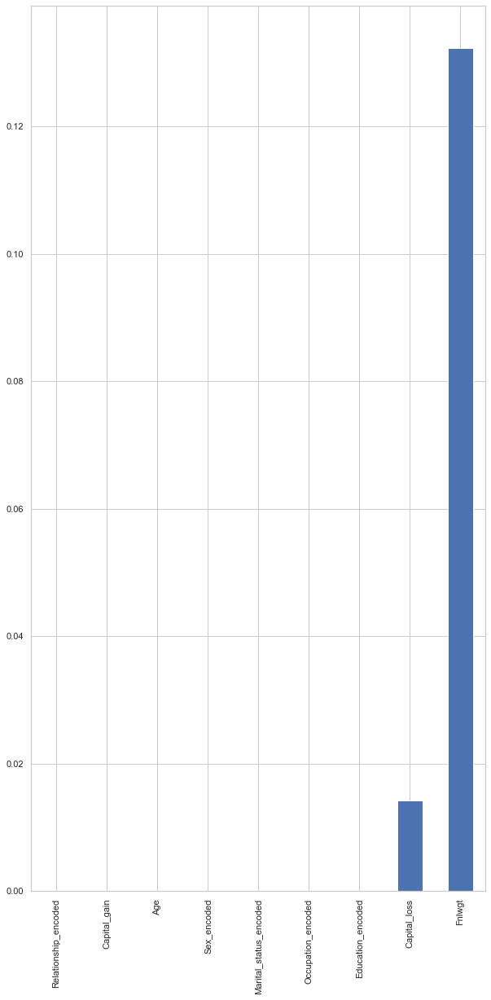

In [107]:
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))

# I have used these transformed values to generate pvalue of each feature (to explain label).

# Mathematical Notation

P Value = (sample proportion - Assumed population proportion in the null hypothesis)/(sqrt((Assumed population proportion in the null hypothesis * ( 1 - Assumed population proportion in the null hypothesis )) / n))

In [108]:
p_values=p_values[p_values<0.05]
p_values.index

Index(['Relationship_encoded', 'Capital_gain', 'Age', 'Sex_encoded',
       'Marital_status_encoded', 'Occupation_encoded', 'Education_encoded',
       'Capital_loss'],
      dtype='object')

# These features strongly impact attrition and control actions are required mainly on these to curb the problems around attrition.

# P Values are an important component of feature selection, with significance level set to 0.05, Variance Threshold
    ensemble technique returns with 95% confidence, all the features that have maximum explanatory capacity
For the present dataset features with pvalues with less than 0.05 are:
Index(['Relationship_encoded', 'Capital_gain', 'Age', 'Sex_encoded',
       'Marital_status_encoded', 'Occupation_encoded', 'Education_encoded',
       'Capital_loss'], dtype='object')

In [110]:
import numpy as np
x=x_frame1.copy()
x=x[['Relationship_encoded', 'Capital_gain', 'Age', 'Sex_encoded',
       'Marital_status_encoded', 'Occupation_encoded', 'Education_encoded',
       'Capital_loss']]
x.sample()

,Relationship_encoded,Capital_gain,Age,Sex_encoded,Marital_status_encoded,Occupation_encoded,Education_encoded,Capital_loss
27162,0.0,1.0,0.501273,1.0,0.350713,0.33046,0.473148,0.0


# The above table displays a sample of final x vector with features and values finally selected to be used for prediction.

In [111]:
y.sample()

12183    0.0
Name: Income_encoded, dtype: float64

# The above series displays a sample of label.

In [112]:
x.shape, y.shape

((27743, 8), (27743,))

# The above cell displays final shapes of x and y vectors

In [113]:
x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.6)

In [114]:
x_train.shape, y_train.shape

((11097, 8), (11097,))

# In the above two cells, I have divided final vectors with train test split technique, in which train data is 40% and test data is 60% to avoid overfitting issue.

# Model Development, Evaluation And Saving (Total Models = 10)

# Selection Reasoning Of Models 1 to 5

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.

Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# The use case assigned revolves around uneven label points hence there is high probality of not achieving a good fit. Hence, I have tried different ensembele techniques that can lower variance and bias and help achieve a goodness of fit. (Just as a reminder, I have already applied variance threshold of 0.01 to ensure that risk of models is low). 

# The theories in the two cells above explain why I have chosen Model 1, Model 2, Model 3, Model 4 and Model 5 for this use case. Model 5 is support vector classifier and hence, is again a very powerful implementation to prevent illness of fit and make appropriate decision boundaries.

# Model 1

# Random Forest Classifier With Intuitional Hyper Parameter Tuning

In [115]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [116]:
model1_prediction_train

,y_train,yhat
16840,0.0,0.0
30259,0.0,0.0
22936,1.0,0.0
15576,1.0,0.0
12050,0.0,0.0
...,...,...
7073,0.0,0.0
29147,0.0,0.0
28065,0.0,0.0
6549,0.0,0.0


In [117]:
model1_prediction_test

,y_test,yhat
12553,0.0,0.0
19191,0.0,0.0
30669,0.0,0.0
25640,1.0,0.0
4377,1.0,0.0
...,...,...
244,0.0,0.0
15371,0.0,0.0
27019,0.0,0.0
7959,0.0,0.0


In [118]:
# Model 1 Metrics

In [119]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))
#Since risk is low model is low variance and since train score and test score are equivalent, model is low bias too.

Train Score:  0.77
Test Score:  0.78
Train Accuracy Score:  0.77
Test Accuracy Score:  0.78
Cross Validation Score:  0.78
Cross Validation Risk:  0.0


In [120]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred))

              precision    recall  f1-score   support

         0.0       0.78      1.00      0.87     12928
         1.0       0.00      0.00      0.00      3718

    accuracy                           0.78     16646
   macro avg       0.39      0.50      0.44     16646
weighted avg       0.60      0.78      0.68     16646



In [121]:
print(confusion_matrix(y_test,ytst_pred))

[[12928     0]
 [ 3718     0]]


In [122]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print(auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

0.5


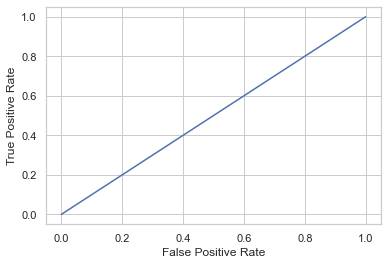

In [123]:
from sklearn import metrics
y_pred_proba =rfc.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()


# Model 2

# Random Forest Classifier With Default Hyper Parameter Tuning

In [124]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [125]:
model2_prediction_train

,y_train,yhat
16840,0.0,0.0
30259,0.0,0.0
22936,1.0,1.0
15576,1.0,1.0
12050,0.0,0.0
...,...,...
7073,0.0,1.0
29147,0.0,0.0
28065,0.0,0.0
6549,0.0,0.0


In [126]:
model2_prediction_test

,y_test,yhat
12553,0.0,0.0
19191,0.0,0.0
30669,0.0,0.0
25640,1.0,0.0
4377,1.0,0.0
...,...,...
244,0.0,1.0
15371,0.0,0.0
27019,0.0,0.0
7959,0.0,0.0


In [127]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  0.93
Test Score:  0.83
Train Accuracy Score:  0.93
Test Accuracy Score:  0.83
Cross Validation Score:  0.84
Cross Validation Risk:  0.0


In [128]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred1))

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89     12928
         1.0       0.64      0.56      0.60      3718

    accuracy                           0.83     16646
   macro avg       0.76      0.73      0.74     16646
weighted avg       0.82      0.83      0.83     16646



In [129]:
print(confusion_matrix(y_test, ytst_pred1))

[[11748  1180]
 [ 1639  2079]]


In [130]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.73


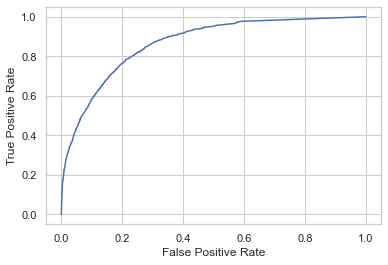

In [131]:
from sklearn import metrics
y_pred_proba =rfc1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [279]:
best_model=pickle.dumps(rfc1) #saving the best model

# Model 3

# RFC With Grid Search CV

In [132]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2})
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2})

In [133]:
# Model 3 Predictions

In [134]:
model3_prediction_train

,y_train,yhat
16840,0.0,0.0
30259,0.0,0.0
22936,1.0,1.0
15576,1.0,1.0
12050,0.0,0.0
...,...,...
7073,0.0,1.0
29147,0.0,0.0
28065,0.0,0.0
6549,0.0,0.0


In [135]:
model3_prediction_test

,y_test,yhat
12553,0.0,0.0
19191,0.0,0.0
30669,0.0,0.0
25640,1.0,0.0
4377,1.0,0.0
...,...,...
244,0.0,1.0
15371,0.0,0.0
27019,0.0,0.0
7959,0.0,0.0


In [136]:
# Model 3 Metrics

In [137]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.93
Test Score:  0.83
Train Accuracy Score:  0.93
Test Accuracy Score:  0.83


In [138]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'entropy', 'max_features': 'auto', 'n_estimators': 50, 'n_jobs': -1, 'oob_score': True, 'warm_start': False}
0.8323881790758761


In [139]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(criterion='entropy', n_estimators=50, n_jobs=-1,
                       oob_score=True)


In [140]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89     12928
         1.0       0.64      0.55      0.59      3718

    accuracy                           0.83     16646
   macro avg       0.76      0.73      0.74     16646
weighted avg       0.82      0.83      0.83     16646

[[11760  1168]
 [ 1656  2062]]


In [141]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.73


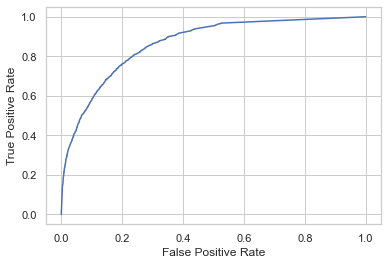

In [142]:
from sklearn import metrics
y_pred_proba =best_estim.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [280]:
best_model1=pickle.dumps(best_estim) #saving the best model

# Model 4

# Bagging Classifier With Grid Search CV Hyper Parameter Tuning

In [143]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000,100000,100000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)
model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [144]:
# Model 4 Predictions

In [145]:
model4_prediction_train

,y_train,yhat
16840,0.0,0.0
30259,0.0,0.0
22936,1.0,1.0
15576,1.0,1.0
12050,0.0,0.0
...,...,...
7073,0.0,1.0
29147,0.0,0.0
28065,0.0,0.0
6549,0.0,0.0


In [146]:
model4_prediction_test

,y_test,yhat
12553,0.0,0.0
19191,0.0,0.0
30669,0.0,0.0
25640,1.0,0.0
4377,1.0,0.0
...,...,...
244,0.0,1.0
15371,0.0,0.0
27019,0.0,0.0
7959,0.0,0.0


In [147]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  0.93
Test Score:  0.83
Train Accuracy Score:  0.93
Test Accuracy Score:  0.83


In [148]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 1000}
0.8263503566658141


In [149]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=1000)


In [150]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.88      0.90      0.89     12928
         1.0       0.62      0.56      0.59      3718

    accuracy                           0.83     16646
   macro avg       0.75      0.73      0.74     16646
weighted avg       0.82      0.83      0.82     16646



In [151]:
print(confusion_matrix(y_test, ytst_pred3))

[[11664  1264]
 [ 1631  2087]]


In [152]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.73


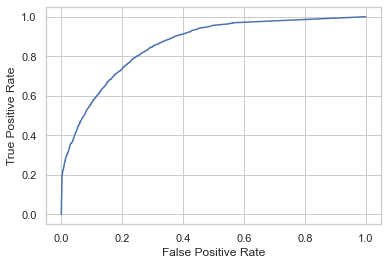

In [153]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [281]:
best_model2=pickle.dumps(best_estim1) #saving the best model

# Model5

# Support Vector Classifier With Sigmoid

In [154]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [155]:
y_pred5=pd.DataFrame(clf.predict(x_train), columns=['yhat'])
print('Train Prediction\n')
y_pred5

Train Prediction



,yhat
0,0.0
1,0.0
2,1.0
3,0.0
4,0.0
...,...
11092,0.0
11093,0.0
11094,0.0
11095,0.0


In [156]:
ytst_pred5=pd.DataFrame(clf.predict(x_test), columns=['yhat'])
print('Test Prediction\n')
ytst_pred5

Test Prediction



,yhat
0,0.0
1,0.0
2,0.0
3,1.0
4,0.0
...,...
16641,1.0
16642,0.0
16643,0.0
16644,0.0


In [157]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.67
Test Score:  0.66
Train Accuracy Score:  0.67
Test Accuracy Score:  0.66
Cross Validation Score:  0.78
Cross Validation Risk:  0.0


In [158]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.78      0.78      0.78     12928
         1.0       0.25      0.25      0.25      3718

    accuracy                           0.66     16646
   macro avg       0.51      0.51      0.51     16646
weighted avg       0.66      0.66      0.66     16646



In [159]:
print(confusion_matrix(y_test, ytst_pred5))

[[10055  2873]
 [ 2785   933]]


In [160]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred5), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.51


In [161]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is off for model development.')

Graph cannot be generated because probability is off for model development.


# Resampling, Rescaling And Re Feature Selection And Re Spliting For Model Optimization

# Reasoning Of Applying Resampling and developing models 6 to 10.

# The goal of ensemble methods is to combine the predictions of several base estimators built with a given learning algorithm in order to improve generalizability / robustness over a single estimator.
Two families of ensemble methods are usually distinguished:

In averaging methods, the driving principle is to build several estimators independently and then to average their predictions. On average, the combined estimator is usually better than any of the single base estimator because its variance is reduced.

Examples: Bagging methods, Forests of randomized trees, etcetera

By contrast, in boosting methods, base estimators are built sequentially and one tries to reduce the bias of the combined estimator. The motivation is to combine several weak models to produce a powerful ensemble.

Examples: AdaBoost, Gradient Tree Boosting,etcetera

# Since, original y vector is highly unsampled, I will do resampling to balance both 1 and 0 data points to ensure that alongwith being low on variance, the model is also low on bias. Hence, I I can achieve, bias variance trade off.

# Hence, I have developed models 6 to 10 based on rfc, ensemble and svm methods on resampled data

In [162]:
y.value_counts() #original y vector, value counts

0.0    21520
1.0     6223
Name: Income_encoded, dtype: int64

0.0    19357
1.0    19357
Name: Income_encoded, dtype: int64


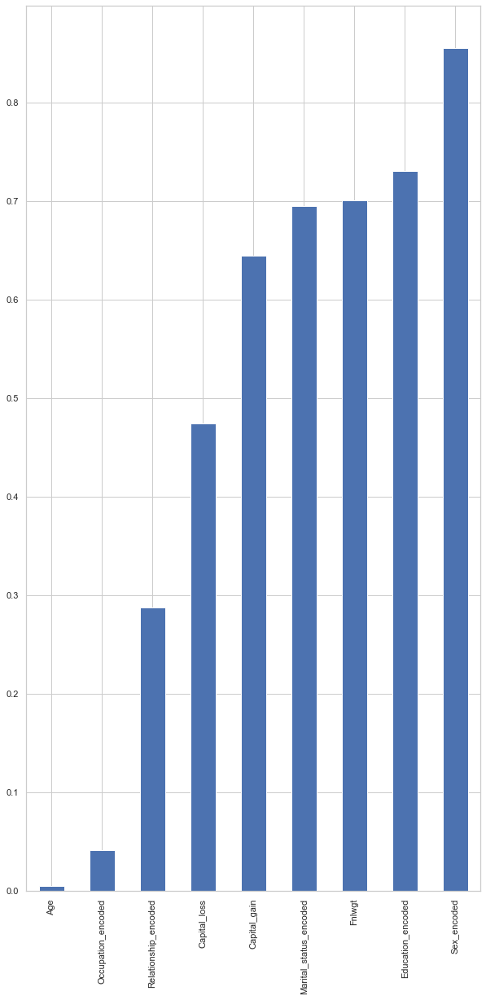

In [236]:
import numpy as np
from sklearn.utils import resample
x_frame11[np.isinf(x_frame11)] = 0
x_frame11[np.isnan(x_frame11)]=0
x=x_frame11.copy()
y=final_dataframe['Income_encoded']
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)
X=pd.concat([x_train, y_train], axis=1)
not_good=X[X['Income_encoded']==0]
good=X[X['Income_encoded']==1]
good_upsampled=resample(good, replace=True, n_samples=len(not_good), random_state=0)
upsampled=pd.concat([not_good, good_upsampled])
x=upsampled.drop('Income_encoded', axis=1)
y=upsampled['Income_encoded']
x[np.isinf(x)] = 0
x[np.isnan(x)]=0
scale=MinMaxScaler([0,1])
scaled_data = scale.fit_transform(x)
scaled_frame=pd.DataFrame(scaled_data, columns=x.columns)
x=scaled_frame
Xf_train, Xf_test, Y_train, Y_test=train_test_split(x,y,test_size=0.1)
print(upsampled['Income_encoded'].value_counts())
constant_filter=VarianceThreshold(threshold=0.01)
constant_filter.fit(Xf_train)
Xf_train_filter=constant_filter.transform(Xf_train)
Xf_test_filter=constant_filter.transform(Xf_test)
sel=f_classif(Xf_train, Y_train)
p_values=pd.Series(sel[1])
p_values.index=Xf_train.columns
p_values.sort_values(ascending=True, inplace=True)
p_values.plot.bar(figsize=(10,20))
p_values=p_values[p_values<0.05]
p_values=pd.DataFrame(p_values, columns=['P Values'])
p_values['Features']=p_values.index
p_values=p_values[['Features', 'P Values']]
if len(p_values.index) != 0:
    x=x[p_values['Features']]
else:
    x=upsampled.drop('Income_encoded', axis=1)
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.1)

# The above matrix represent balanced label vector with 1105 data points for 0 and 1105 data points for 1. And the graph shoows new set of strong indicators based on p values, with variance threshold as low as 0.01 and comfidence as 95%.

In [237]:
p_values

,Features,P Values
Age,Age,0.005234
Occupation_encoded,Occupation_encoded,0.041235


In [238]:
x_train.sample()

,Age,Occupation_encoded
36096,0.0,0.0


In [239]:
y_train.sample()

3653    1.0
Name: Income_encoded, dtype: float64

# Model 6

# RFC On Resampled Data With Intuitional Hyper Parameter Tuning

In [240]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostRegressor
import matplotlib.pyplot as plt
import pickle
rfc=el(200, criterion='entropy', random_state=100, max_features='sqrt', min_weight_fraction_leaf=0.1, min_impurity_decrease=0.01, n_jobs=-1, warm_start=True, max_depth=30, max_leaf_nodes=10, ccp_alpha=1, oob_score=True, bootstrap=True)
rfc.fit(x_train, y_train)
model1_train_score=rfc.score(x_train, y_train)
model1_test_score=rfc.score(x_test, y_test)
scores=cross_val_score(rfc, x, y, cv=5)
cv_scores=scores.mean()
cv_risk=scores.std()
y_pred=rfc.predict(x_train)
ytst_pred=rfc.predict(x_test)
model1_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred})
model1_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred})

In [241]:
model1_prediction_train

,y_train,yhat
28387,0.0,1.0
27918,0.0,1.0
636,1.0,1.0
3579,1.0,1.0
23670,1.0,1.0
...,...,...
14786,1.0,1.0
9797,1.0,1.0
5301,0.0,1.0
30362,1.0,1.0


In [242]:
model1_prediction_test

,y_test,yhat
23626,1.0,1.0
968,0.0,1.0
2256,0.0,1.0
24339,0.0,1.0
5990,0.0,1.0
...,...,...
10328,0.0,1.0
17225,1.0,1.0
2226,1.0,1.0
23259,1.0,1.0


In [243]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.5
Test Score:  0.5
Train Accuracy Score:  0.5
Test Accuracy Score:  0.5
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [244]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred))
print(confusion_matrix(y_test, ytst_pred))

              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00      1940
         1.0       0.50      1.00      0.67      1932

    accuracy                           0.50      3872
   macro avg       0.25      0.50      0.33      3872
weighted avg       0.25      0.50      0.33      3872

[[   0 1940]
 [   0 1932]]


In [245]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.5


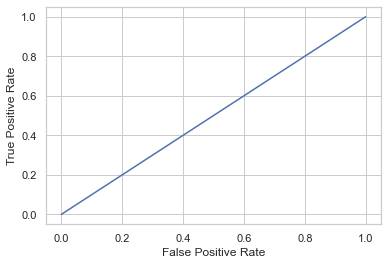

In [246]:
from sklearn import metrics
try:
    y_pred_proba =rfc.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model 7

# RFC On Resampled Data With Default Hyper Parameter Tuning

In [247]:
from sklearn.ensemble import RandomForestClassifier as el
from sklearn.model_selection import cross_val_score
rfc1=el()
rfc1.fit(x_train, y_train)
model2_train_score=rfc1.score(x_train, y_train)
model2_test_score=rfc1.score(x_test, y_test)
scores1=cross_val_score(rfc1, x, y, cv=5)
cv_scores1=scores1.mean()
cv_risk1=scores1.std()
y_pred1=rfc1.predict(x_train)
ytst_pred1=rfc1.predict(x_test)
model2_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred1})
model2_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred1})

In [248]:
y_pred1

array([0., 0., 1., ..., 1., 0., 0.])

In [249]:
ytst_pred1

array([0., 0., 0., ..., 0., 1., 0.])

In [250]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(rfc1.score(x_train, y_train),2))
print('Test Score: ', np.round(rfc1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred1),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred1),2))
print('Cross Validation Score: ', np.round(cv_scores1,2))
print('Cross Validation Risk: ', np.round(cv_risk1,2))

Train Score:  0.57
Test Score:  0.54
Train Accuracy Score:  0.57
Test Accuracy Score:  0.54
Cross Validation Score:  0.48
Cross Validation Risk:  0.06


In [251]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred1), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.54


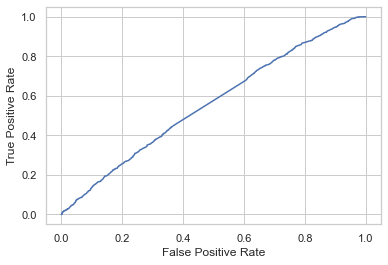

In [252]:
from sklearn import metrics
try:
    y_pred_proba =rfc1.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model8

# RFC With Grid Search CV On Resampled Data

In [253]:
from sklearn.datasets import load_boston
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier
import matplotlib.pyplot as plt
rfc2=el()
params = {
 'n_estimators': [50, 100],
 'max_features':['auto', 'sqrt', 'log2'],
 'criterion' : ['entropy', 'gini'],
 'bootstrap': [True, False],
 'oob_score':[True, False],
 'n_jobs':[None,-1],
 'warm_start':[True, False]
}
gridsearch=GridSearchCV(rfc2, params, cv=5, return_train_score=True)
gridsearch.fit(x_train, y_train)
best_parameters=gridsearch.best_params_
best_score=gridsearch.best_score_
best_estim=gridsearch.best_estimator_
best_estim.fit(x_train,y_train)
y_pred2=best_estim.predict(x_train)
model3_train_score=best_estim.score(x_train, y_train)
model3_test_score=best_estim.score(x_test, y_test)
ytst_pred2=best_estim.predict(x_test)
model3_save=pickle.dumps(best_estim)
model3_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred2}) # Model 8 train prediction
model3_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred2}) # Model 8 test prediction

In [254]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred2),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred2),2))

Train Score:  0.57
Test Score:  0.54
Train Accuracy Score:  0.57
Test Accuracy Score:  0.54


In [255]:
print(gridsearch.best_params_)
print(gridsearch.best_score_)

{'bootstrap': True, 'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 50, 'n_jobs': None, 'oob_score': True, 'warm_start': True}
0.5454052175296898


In [256]:
best_estim=gridsearch.best_estimator_
print(best_estim)

RandomForestClassifier(criterion='entropy', max_features='sqrt',
                       n_estimators=50, oob_score=True, warm_start=True)


In [257]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred2))

print(confusion_matrix(y_test, ytst_pred2))

              precision    recall  f1-score   support

         0.0       0.54      0.63      0.58      1940
         1.0       0.55      0.45      0.50      1932

    accuracy                           0.54      3872
   macro avg       0.54      0.54      0.54      3872
weighted avg       0.54      0.54      0.54      3872

[[1228  712]
 [1057  875]]


In [258]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred2), 2)
    print('auc: ',auc)
except ValueError:
    print('Data Is Imbalanced, ROC AUC Curve Cannot Be Generated.')

auc:  0.54


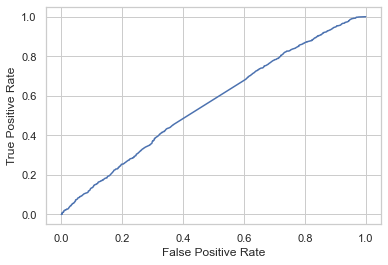

In [259]:
from sklearn import metrics
try:
    y_pred_proba =best_estim.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except IndexError as err:
    print(err)

# Model 9

# Bagging Classifier With Grid Searh CV Hyper Parameter Tuning On Resampled Data

In [260]:
import sklearn
abreg1 = sklearn.ensemble.BaggingClassifier()
params = {
 'n_estimators': [50, 100],
 'bootstrap': [True, False],
 'random_state': [0,10,100,1000,10000],
 'oob_score': [True, False]
 }
gridsearch1=GridSearchCV(abreg1, params, cv=5, return_train_score=True)
gridsearch1.fit(x_train, y_train)
best_parameters1=gridsearch1.best_params_
best_score1=gridsearch1.best_score_
best_estim1=gridsearch1.best_estimator_
best_estim1.fit(x_train,y_train)
y_pred3=best_estim1.predict(x_train)
model4_train_score=best_estim1.score(x_train, y_train)
model4_test_score=best_estim1.score(x_test, y_test)
ytst_pred3=best_estim1.predict(x_test)

model4_prediction_train=pd.DataFrame({'y_train':y_train, 'yhat':y_pred3})
model4_prediction_test=pd.DataFrame({'y_test':y_test, 'yhat':ytst_pred3})

In [261]:
model4_prediction_train

,y_train,yhat
28387,0.0,0.0
27918,0.0,0.0
636,1.0,1.0
3579,1.0,1.0
23670,1.0,0.0
...,...,...
14786,1.0,0.0
9797,1.0,1.0
5301,0.0,1.0
30362,1.0,0.0


In [262]:
model4_prediction_test

,y_test,yhat
23626,1.0,0.0
968,0.0,0.0
2256,0.0,0.0
24339,0.0,1.0
5990,0.0,0.0
...,...,...
10328,0.0,0.0
17225,1.0,0.0
2226,1.0,0.0
23259,1.0,1.0


In [263]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(best_estim1.score(x_train, y_train),2))
print('Test Score: ', np.round(best_estim1.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train, y_pred3),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test, ytst_pred3),2))

Train Score:  0.57
Test Score:  0.54
Train Accuracy Score:  0.57
Test Accuracy Score:  0.54


In [264]:
print(gridsearch1.best_params_)
print(gridsearch1.best_score_)

{'bootstrap': True, 'n_estimators': 100, 'oob_score': True, 'random_state': 10000}
0.5437693564694163


In [265]:
best_estim=gridsearch1.best_estimator_
print(best_estim)

BaggingClassifier(n_estimators=100, oob_score=True, random_state=10000)


In [266]:
from sklearn .metrics import roc_auc_score
try:
    auc = np.round(roc_auc_score(y_test, ytst_pred3), 2)
    print('auc: ',auc)
except ValueError as err:
    print(err)

auc:  0.54


In [267]:
y_train.unique()

array([0., 1.])

In [268]:
y_test.unique()

array([1., 0.])

In [269]:
y.unique()

array([0., 1.])

In [270]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test, ytst_pred3))
print(confusion_matrix(y_test, ytst_pred3))

              precision    recall  f1-score   support

         0.0       0.54      0.63      0.58      1940
         1.0       0.55      0.45      0.50      1932

    accuracy                           0.54      3872
   macro avg       0.54      0.54      0.54      3872
weighted avg       0.54      0.54      0.54      3872

[[1220  720]
 [1058  874]]


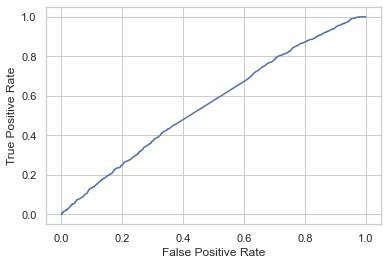

In [271]:
from sklearn import metrics
y_pred_proba =best_estim1.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

#create ROC curve
plt.plot(fpr,tpr)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

# Model 10

# Support Vector Classifier with sigmoid to prevent overfitting on resampled data

In [272]:
from sklearn import svm
clf = svm.SVC(kernel='sigmoid')
model5_prediction=clf.fit(x_train, y_train)
cross_scores=clf.score(x_train, y_train)
cross_risk=clf.score(x_test, y_test)

In [273]:
y_pred5=clf.predict(x_train)
y_pred5

array([1., 1., 0., ..., 1., 1., 1.])

In [274]:
ytst_pred5=clf.predict(x_test)
ytst_pred5

array([1., 1., 1., ..., 0., 0., 1.])

In [275]:
from sklearn.metrics import accuracy_score
print('Train Score: ', np.round(clf.score(x_train, y_train),2))
print('Test Score: ', np.round(clf.score(x_test, y_test),2))
print('Train Accuracy Score: ', np.round(accuracy_score(y_train,y_pred5),2))
print('Test Accuracy Score: ', np.round(accuracy_score(y_test,ytst_pred5),2))
print('Cross Validation Score: ', np.round(cv_scores,2))
print('Cross Validation Risk: ', np.round(cv_risk,2))

Train Score:  0.51
Test Score:  0.5
Train Accuracy Score:  0.51
Test Accuracy Score:  0.5
Cross Validation Score:  0.5
Cross Validation Risk:  0.0


In [276]:
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(y_test,ytst_pred5))
print(confusion_matrix(y_test,ytst_pred5))

              precision    recall  f1-score   support

         0.0       0.50      0.40      0.45      1940
         1.0       0.50      0.59      0.54      1932

    accuracy                           0.50      3872
   macro avg       0.50      0.50      0.49      3872
weighted avg       0.50      0.50      0.49      3872

[[ 785 1155]
 [ 784 1148]]


In [277]:
from sklearn import metrics
try:
    y_pred_proba =clf.predict_proba(x_test)[::,1]
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_proba)

    #create ROC curve
    plt.plot(fpr,tpr)
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
except AttributeError:
    print('Graph cannot be generated because probability is turned off for model development.')

Graph cannot be generated because probability is turned off for model development.


# Best Models are saved in pickle for production

# Conclusion
# There are 3 best models based on auc are mentioned below. All the 3 models have auc=0.73

# Model 2: RFC With Default Hyper Parameter Tuning

Train Score:  0.93

Test Score:  0.83

Train Accuracy Score:  0.93

Test Accuracy Score:  0.83

Cross Validation Score:  0.84

Cross Validation Risk:  0.0

              precision    recall  f1-score   support


    0.0       0.88      0.91      0.89     12928

    1.0       0.64      0.56      0.60      3718


    accuracy                           0.83     16646

    macro avg       0.76      0.73      0.74     16646

    weighted avg       0.82      0.83      0.83     16646


print(confusion_matrix(y_test, ytst_pred1))

[[11748  1180]

[ 1639  2079]]

auc:  0.73

# Model 3: RFC With Grid Search CV

Train Score:  0.93

Test Score:  0.83

Train Accuracy Score:  0.93

Test Accuracy Score:  0.83


print(confusion_matrix(y_test, ytst_pred2))
              precision    recall  f1-score   support

         0.0       0.88      0.91      0.89     12928

        1.0       0.64      0.55      0.59      3718


    accuracy                           0.83     16646

    macro avg       0.76      0.73      0.74     16646

 weighted avg       0.82      0.83      0.83     16646

[[11760  1168]

[ 1656  2062]]

auc:  0.73


# Model4: Bagging Classifier With Grid Search CV

Train Score:  0.93

Test Score:  0.83

Train Accuracy Score:  0.93

Test Accuracy Score:  0.83



                precision    recall  f1-score   support

         0.0       0.88      0.90      0.89     12928

         1.0       0.62      0.56      0.59      3718

    accuracy                           0.83     16646

    macro avg       0.75      0.73      0.74     16646

weighted avg       0.82      0.83      0.82     16646


[[11664  1264]

[ 1631  2087]]

auc:  0.73
 
 Please note, metrics calculation is explained above while development and evaluation.

# Credits:
DataTrained and Python Documentations.